# **Starbucks Location Analysis**

## 1. Introduction
Walking down the streets in Manhattan, New York, aside from the fast-paced pedestrians and action-film-skill-level yellow cabs, Starbucks stores are probably the most often seen objects. As the largest coffee chain in the United States, it isn't only famous for its controversially delicious beverages, but as well for its stores location strategy. The question of "why does Starbucks choose a certain location" is a common business problem for it provides valuable insight into location selection strategy for its competitors as well as entrepreneurs seeking to open a store within an even remotely related industry.

This project aims to dig into the location selection of Starbucks, from a micro perspective, using Manhattan as research soil. To be more specific, we study all Starbucks locations in five boroughs of New York and try to figure out the similarities among these locations based on the venues within those locations' proximity. We will use Foursquare API to retrieve location data, define a "Starbucks proximity score" for a given location, and implement machine learning techniques to score any given location. The score will provide guidance for new Starbucks store location selection, but more importantly, for aspiring individual investors to open similar stores, for example, a fast food store or a tea house.

Data and analysis method used in the project will be discussed in more detail in the Data section.


## 2. Data Preparation and Pre-Processing

###  2.1 Working with NYC Census Data 

Our data processing includes dividing up the targeted area, i.e. the five boroughs of New York City, into small fractions. The census tracts used by City Government is perfect for this.

After loading in the data and take a first look, we see that each observation is a tract, and what we need is "the_geom" column, which contains coordinates for the vertices of each polygon that traces the tract.

We take the column and cleaning it up to form a dataframe containing all these coordinates

NYC Census data link:
https://data.cityofnewyork.us/City-Government/2010-Census-Tracts/fxpq-c8ku/

### 2.2 Potential Testing Locations
The process for opening a coffee shop/restaurant starts with collecting a pool of candidate locations. Normally you would pick whichever best location available instead of finding a perfect location and then search for an available space within, as most likely there wouldn't be any. So we quickly searched through *Loopnet.com*, which is the go-to website for commercial property search, and found ourselves the following available spaces. Of course this project aims to provide insights *only* from the location point of view, so the reason why these locations are selected is irrelevant. As a matter of fact, for demonstration purposes, we might as well generate random coordinates on the map and work with that, but we believe actual locations serve the purpose better.

In the modeling process, these test locations, or rather, the tracts containing them will be seperated from the data as the independent test set. We will also split up the remaining data into training set and validation set to improve model performance

### 2.3 Foursquare API -- Starbucks Locations
We will use Foursquare API to extract location data. The data needed consists of several parts. First we use the search function to get all Starbucks locations wihin New York City, and for each tract, determine how many Starbucks are in it. This will be the target value (y-values) of our data. Then we use explore function to get all venues within a certain distance of each tract. These venues data is used to form the features of our data (X-values).

First enter the Foursquare credentials

The following function uses Foursquare API to search venues with a specific keyword, within a certain radius of a given location.

In order for the Starbucks locations obtained to be as inclusive as possible, we go through the following process to break down our search into many mini-searches, and then combine the results together to form the whole picture.

And more specifically:
1. We take advantage of the data we already have, i.e. the census tract data, which has tons of coordinates, and obtain all of them;
2. With some rudimentary counting, we realized that the number of coordinates are too large to be fed into Foursqure API to perform a point by point search--Foursquare APIs are bound by a 5,000 hourly calls and 99,500 daily calls, yet all location points within the tracts dataset is around 167K (As shown below). In addition, since these coordinates are to define the boundaries of tracts, a large amount of them are extremely close to each other, resulting in high redundancy for our use case. For these reasons, we do the following:
    
    - Round all coordinates to their 3rd decimals and remove duplicate values. This way we remove location points that are too close to each other to make significant difference while maintaining necessary accuracy, as keeping only 2 decimal would not suffice;
    - The resulting dataset (~26K) is still too large for the 5,000 hourly call limit, so we perform the searches step by step. We do 10 iterations, during each randomly picking 300 coordinates to perform a search. So in total we have 3,000 search points, which is adequate for the purpose of retrieving all Starbucks locations

The following steps are data cleaning, which may seem a bit trivial, yet we need to make sure all Starbucks locations we got are:
1. In fact, Starbucks locations;
    - Here we include only locations with "starbucks" keyword in their venue name;
2. Locate within New York City, due to borderline possibilities;
    - Keep locations only with postal codes in NYC, before which we need to fill in a few locations' missing postal code;
3. Unique locations, since the nature of our search method leads to unavoidable overlapping;
    - Remove duplicate values;
4. At last, overall comprehensive and processable.
    - Cleaning up and visualization

Here's what all the locations look like on the map:

In [5]:
map1

Next step is to generate the target value part of our dataset for analysis. We loop through each tract to count the number of Starbucks within it.

Now we visualize the result: areas with more Starbucks locations shown in darker color.

It's not hard to see that Starbucks are densely located in Manhattan, and especially highly populated areas such as midtown and downtown, while in the other four boroughs the locations are very much scattered.



In [10]:
map2

### 2.4 Foursquare API -- Nearby Venues 
Now we're onto the next step to get locations data for each tract, constructin our dependent variable (X) for our analysis.

Similar to pulling Starbucks data, here we split the process into 10 batches as the API sometimes get timeout errors if too many calls are accumulated within a short period of time.

Check the number of tracts with venues, which is the effective sample size of our data. And then one-hot encoding for each tract, and calculate the mean each type of venue.

### 2.5 Final Data Preparation

#### 2.5.1 Train-Test Dataset Split

Finally we need to split our dataset into training and testing groups. As mentioned previously, testing group will consists of the 8 locations in the test_location data. We need to mark these observations and split them from our previous *nyc_grouped* dataset. 

#### 2.5.2 Class Imbalance

One problem with our data is class imbalance, namely the amount of data with label 0 is much greater than that with other labels. This is problematic because a model predicting all label to be 0 would have a high accuracy. Here we take the simplest solution of over-sampling -- we replicate the samples with other labels to make the sample sizes comparable. 

Specifically, we make the sample size with other labels approximately 2.5 times the sample size of label 0. This is just a rudimentary result from trial and error and is subject to improvement.

## 3. Methodology

After trying different classification models, we landed on a single layer neural network due to performance. Other models compared includes K nearest neighbours, random forest, adaboost, etc. 

We use cross-validation for hyper-parameter tuning, and landed on a newrual network with one hidden layer of 16 nodes. 

Next we plot the confusion matrix for testing. Note that we are interested in locations with a higher predicted value than its actual value, indicating a potential for a new store.
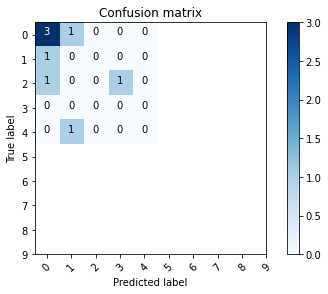

## 4. Results and Discussion

### 4.1 Results

The best locations for potentially opening a new store is given by the locations with a predicted label value greater than the actual label value. As a result, two locations met the requirements.

In [7]:
map3

### 4.2 Discussion

The project achieved its goal using simple machine learning techniques and data science tools. However it does have a number of shortcomings for future improvements.

1. The problem we seek solution is not a standard classification problem, in the sense that even the data available is not considered absolutely *right*, because we can actually select any location to open more stores to change the data. So classification accuracy in the testing data is not as important as in the training data, since we need the inaccuracy to provide insights.

2. Sample size is limited compared to number of features available. 
   - This work only focus on extracting *venues* data that is close to a certain area while there are huge amounts of other types of data that can be easily incorporated such as demographic;
   - Even then, we have 538 features compared to only ~2,000 data points. This could potentially lead to overfitting so we tried using Principal Component Analysis(PCA)/Sparse PCA to reduce dimensionality, but the result is not ideal so it was dropped in the end.
   - Nonetheless, future work could be done on expanding the data size by potentially include data from more cities with similar charateristics as New York such as Chicago, London, etc.

3. The data is very sparse, so we could further explore other options in data processing and modeling to better fit such dataset. Potentially a model designed specifically for sparse data would do a better job.

4. Again, there are other excellent sources of data availble for improvement. From a more realistic perspective, only looking at Starbucks would not be enough. A collection of similar stores would be a good starting point for next steps. 

## 5. Conclusion

Our analysis process is as follows:

We extracted Starbucks locations throughout New York City, and combined it with New York City census data to allocate Starbucks locations into tracts. Then we pulled venues data from Foursquares API to characterize each tract by venues within them. Then we process the data we have, combined with Loopnet data to construct our training-validation-testing datasets. Finally we depoly a neural network model to predict each location's Starbucks store count, constrasting it with the actual store count to get new store potentials.

What we've learnt from the above analysis are:

1. Starbucks locations clusters towards dense areas such as Midtown and Downtown Manhattan, Downtown Brooklyn, etc. Not only that, potential new stores also tend to fall into these areas, indicating that the market is still yet to be saturated;

2. Even though the data size is not very large, a good model still provides excellent insight in predicting and evaluating business location selection.